<a href="https://colab.research.google.com/github/uol-mediaprocessing-202021/medienverarbeitung-c-bokeh-effect/blob/dev/medienverarbeitung_c_bokeh_effect_english.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#Bokeh effect
<img src="https://raw.githubusercontent.com/uol-mediaprocessing-202021/medienverarbeitung-c-bokeh-effect/dev/title_image.jpg" width="600"/> <br>
Contributors: Roman Kammer, Malte Trauernicht and Jona Schrader <br>
Medienverarbeitung WiSe 20/21 <br>
Carl-von-Ossietzky Universität Oldenburg

##Table of contents


1. Introduction
2. Goals
  1. Examples and criteria
3. Theory and methodology
  1. The term Bokeh
  2. Quality of the Bokeh effect
  3. Character of the Bokeh effect
4. Approaches and libraries
  1. PyTorch
  2. PoolNet
  3. MegaDepth
  4. SLIC Superpixel
  5. Mask differences
  6. Data sets
5. Process and implementation
  1. Analysing the picture
    1.   Edge detection
    2.   Listeneintrag
  2. Graphic user interface
6. Restrictions and difficulties
  1. Difficulties
  2. Listeneintrag
7. Vision
8. Reflection and conclusion
9. References











##1. Introduction

The smartphone camera today is the most used medium to take pictures and hold on to important moments in our everyday life. Most of the time the recorded moment is restricted by technical limitations. Therefore it's almost impossible to get a great Bokeh effect with your smartphone. Alot of newer Smartphones try to simulate a Bokeh in retrospect to compensate the technical limitations.
In this project we try to complement an existing picture with a Bokeh effect.  

##2. Goals


*   Importing existing picture
*   Analyse the image data
*   Evaluate which data is important (Object in focus, Light sources, Background etc.)
*   Try out and implement different methods to edit an image (focus peaking, Edge detection)
*   Determine the best results
*   Using machine learning






#3. Theory and methodology

> Eingerückter Textblock



###3.1 The term Bokeh
The term Bokeh finds its heritage in the japanese language or society and means "blurred", "fuzzy" or "out of focus". The term was used since the 80s in the japanese photographing scene (Schuhmacher, o.D.).
Meanwhile the term is one of the central key words in the field of image editing and Image composition.
The goal is to generate an artistic effect on the picture, where the focus is laying on one object in the scenery and the rest is set blurry. In this way the whole intention is directed on the object in focus. The Background and the Bokeh character are contributing to the Overall picture creating a pleasant, elegant and esthetic effect for the viewer of the picture.
But as we all know, the effect of the picture, whether its well received or not, are laying in the eyes of the beholder


###3.2 Quality of the Bokeh effect
The quality of the bokeh effect is hard to determine. Some say it's identifiable by the blured elements and the character of the blurred light sources. Others claim to evaluate all elements of the picture such as the transition of the object in focus to the background to be able to judge the overall picture and how it's received.
All in all the judgement of a Bokeh effect is very objetive. 
<br>
![alt text](https://images.pexels.com/photos/3557597/pexels-photo-3557597.jpeg?auto=compress&cs=tinysrgb&dpr=2&h=150&w=200 "Logo Title Text 1") 
<br>

###3.3 Character of the Bokeh effect
Objectives of compact cameras perceive light differntly than the human eye.
In a way the Bokeh could be described as a misinterpretation from the objective.
The character of the bokeh effect depends on the used objective.
For example the number of aperture blades is affecting the shape of the blurred elements. A small number creates hexagons and octagons while a greater number creates circles as the bokeh character. <br>
Furthermore there are a couple of objective which create special bokeh effects. Some of the are: <br>
**Mirror lense objectives:** This objective creates blurred elements in the shape of rings. <br>

<figure>
  <img src="https://upload.wikimedia.org/wikipedia/commons/8/8f/Bad_Bokeh_Background.jpg" height="200">
  <img src="https://upload.wikimedia.org/wikipedia/commons/thumb/3/36/Rubinar_500mm_5_6_V04.jpg/1024px-Rubinar_500mm_5_6_V04.jpg" height="200">
  <figcaption>Photograph: Armin Kübelbeck, CC-BY-SA, Wikimedia Commons</figcaption>
</figure>   

<br>

**Anamorphic or cinematographic objektive:** These objectives are used for the most part in the field of cinematography and create oval fuzzy elements.

<figure>
  <img src="https://upload.wikimedia.org/wikipedia/commons/thumb/f/f7/Scope_Aperture.jpg/1024px-Scope_Aperture.jpg" height="200">
  <figcaption>Tube of a anamorphic objektive</figcaption>
</figure>

**Helios 44:** The created Bokeh of this objective is called "Swirly Bokeh". The blur circulates towards the center of the image.

<figure>
  <img src="https://i2.wp.com/digital-photography-school.com/wp-content/uploads/2014/08/Hacking_Photography_Helios_44-2_Lens-0451.jpg?w=600&ssl=1" title="https://i2.wp.com/digital-photography-school.com/wp-content/uploads/2014/08/Hacking_Photography_Helios_44-2_Lens-0451.jpg?w=600&ssl=1" height="200">
  <figcaption>Photograph: Mike Newton, www.digital-photography-school.com, "Creating Swirly Bokeh with the Helios 44-2 lens"</figcaption>
</figure>

In the further course we tackle these different charateristics and try to create individual objective profiles to simulate these effects.

###3.3 Process pipeline









##4. Process and implementation
In this part of our project, we explain you how we are going to implement the Bokeh effect. First of all we will provide ourselfes with necessary informations to get an overview on which methods and functions we are going to use to edit an existing image. 
###4.1 Analysing the image

####4.1.1 Edge detection

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import torch
import torchvision
from skimage import io
from google.colab.patches import cv2_imshow
from scipy import ndimage

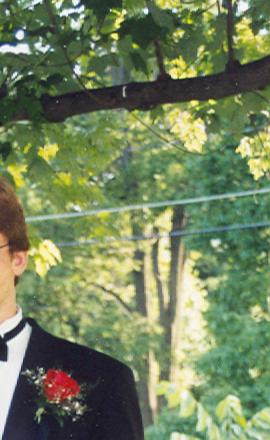

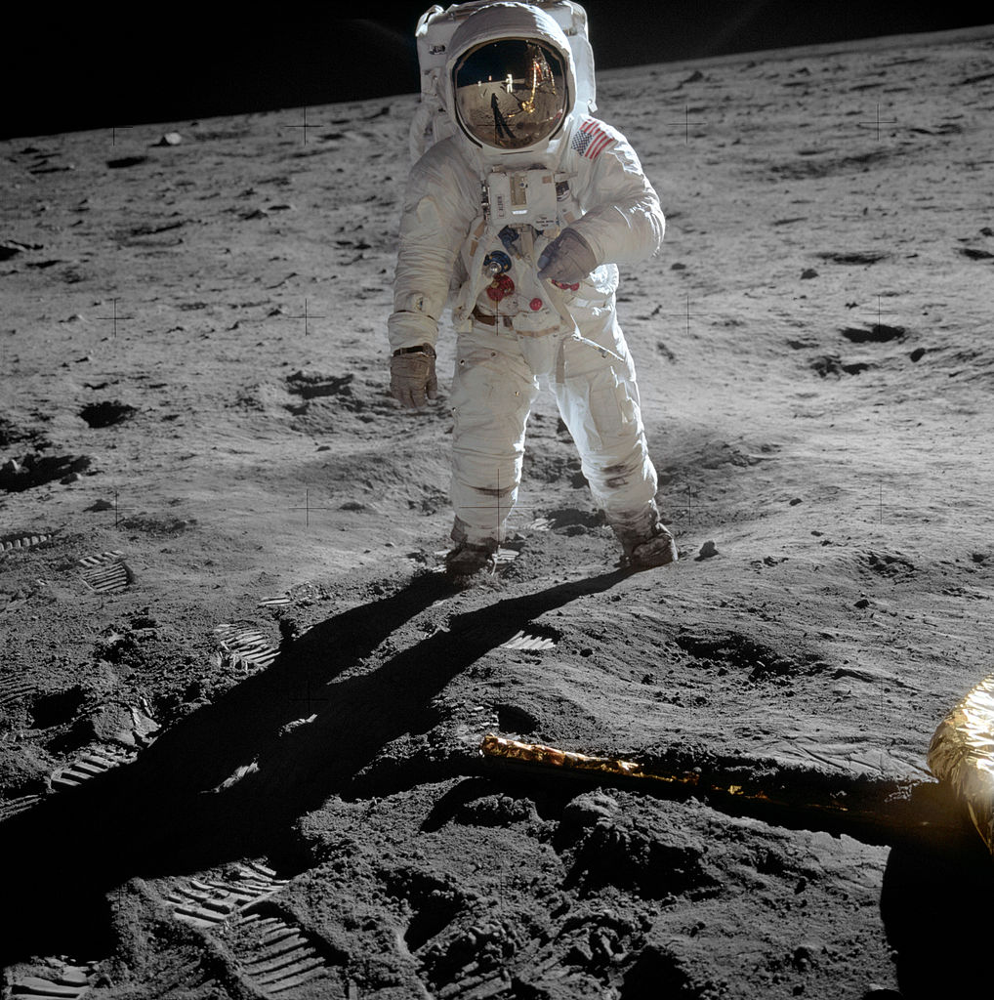

In [ ]:
image = io.imread('https://upload.wikimedia.org/wikipedia/commons/0/0c/Faux-bokeh-original.png')
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
image2 = io.imread('https://upload.wikimedia.org/wikipedia/commons/thumb/9/98/Aldrin_Apollo_11_original.jpg/1018px-Aldrin_Apollo_11_original.jpg')
image2 = cv2.cvtColor(image2, cv2.COLOR_BGR2RGB)
cv2_imshow(image)
cv2_imshow(image2)

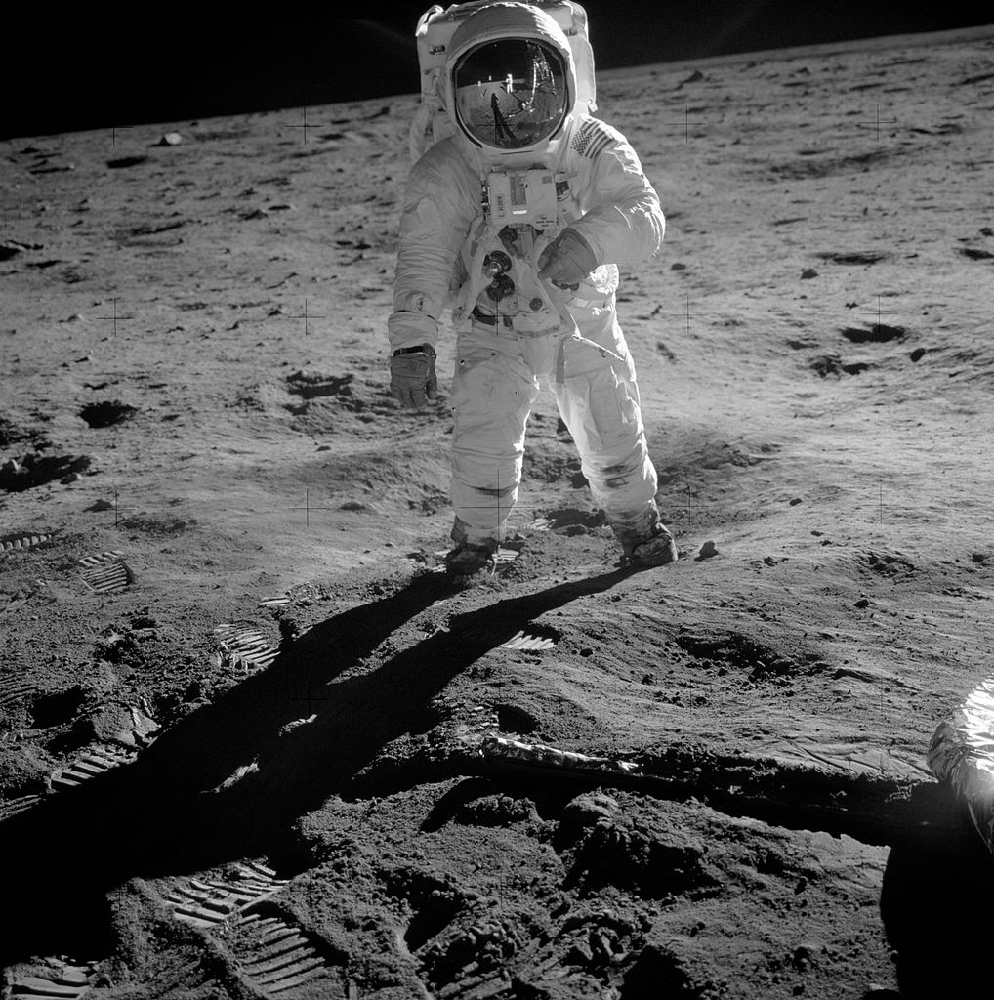

In [ ]:
gray = cv2.cvtColor(image2, cv2.COLOR_RGB2GRAY)
cv2_imshow(gray)

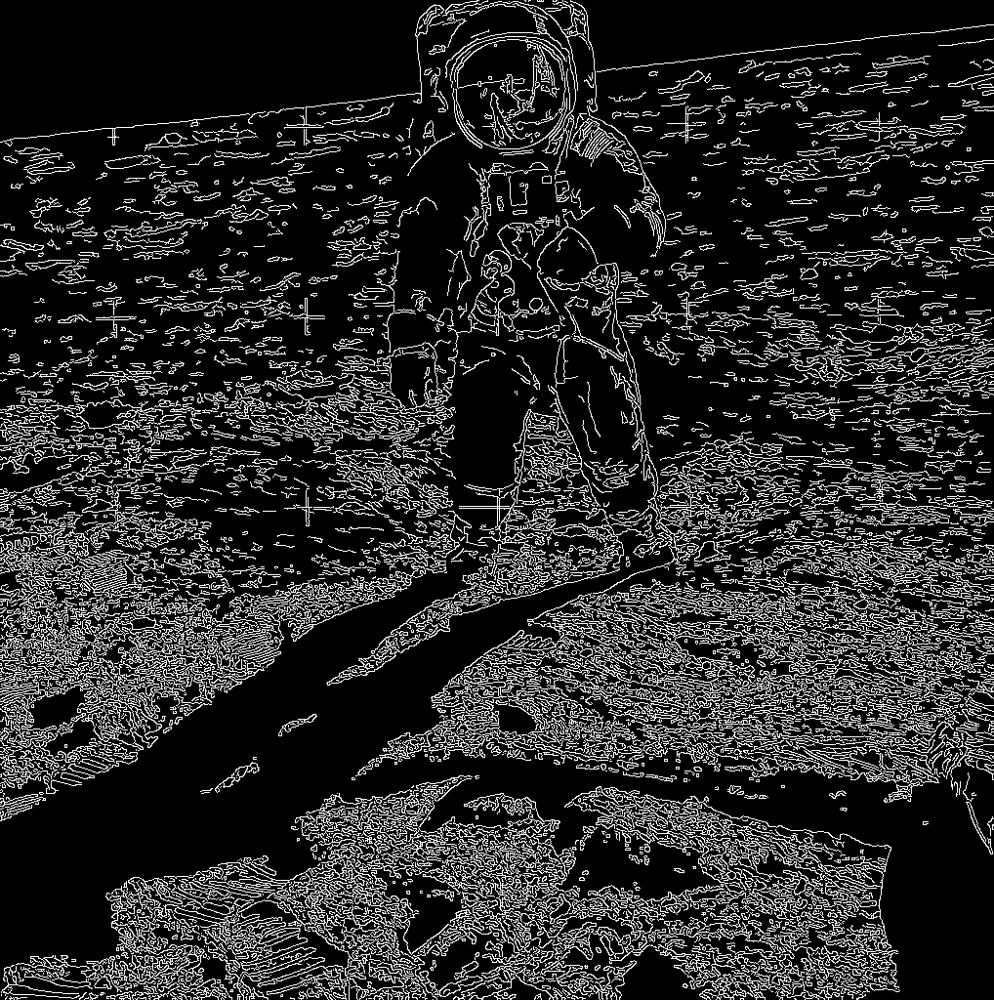

In [ ]:
def auto_canny(image, sigma=0.33):
	v = np.median(image)
	lower = int(max(0, (1.0 - sigma) * v))
	upper = int(min(255, (1.0 + sigma) * v))
	edged = cv2.Canny(image, lower, upper)
	return edged
blurred = cv2.GaussianBlur(gray, (3, 3), 0)
edges_canny = auto_canny(blurred)
cv2_imshow(edges_canny)

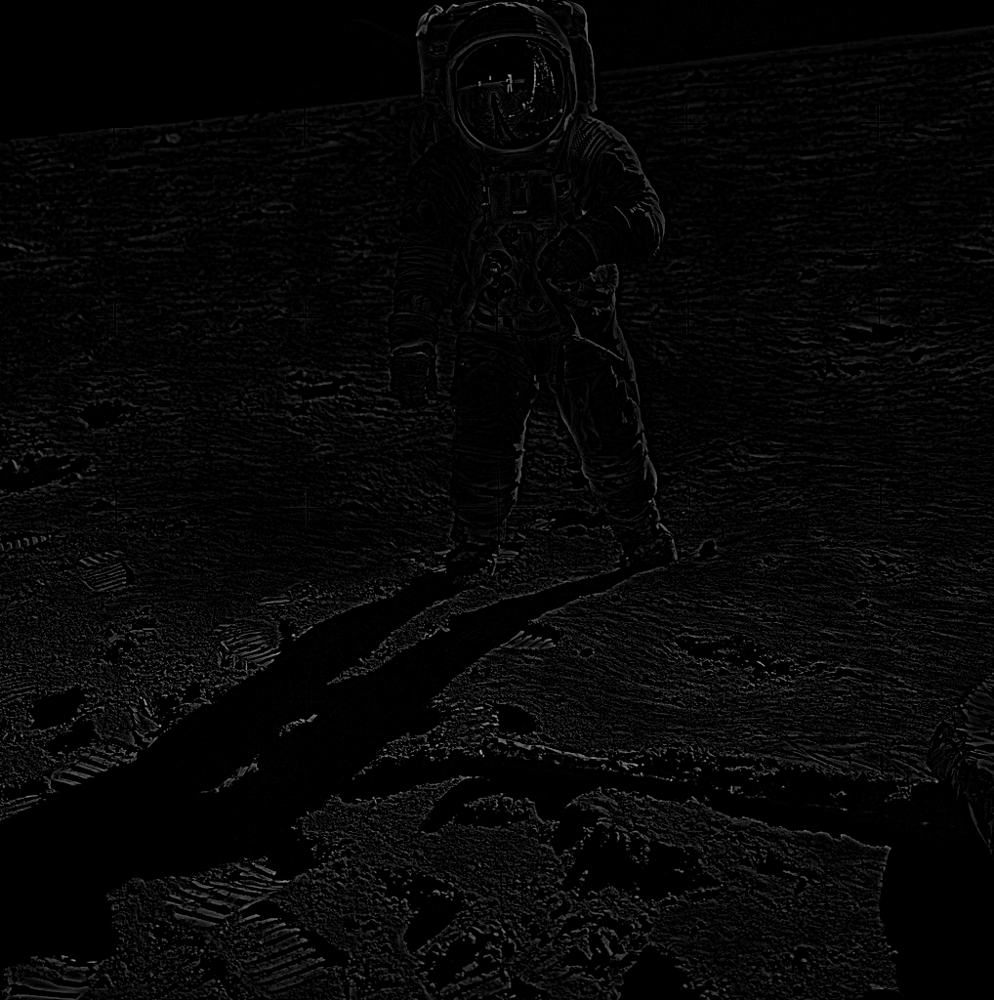

In [ ]:
data = np.array(gray, dtype=float)
lowpass = ndimage.gaussian_filter(data, 3)
gauss_highpass = data - lowpass
cv2_imshow(gauss_highpass)

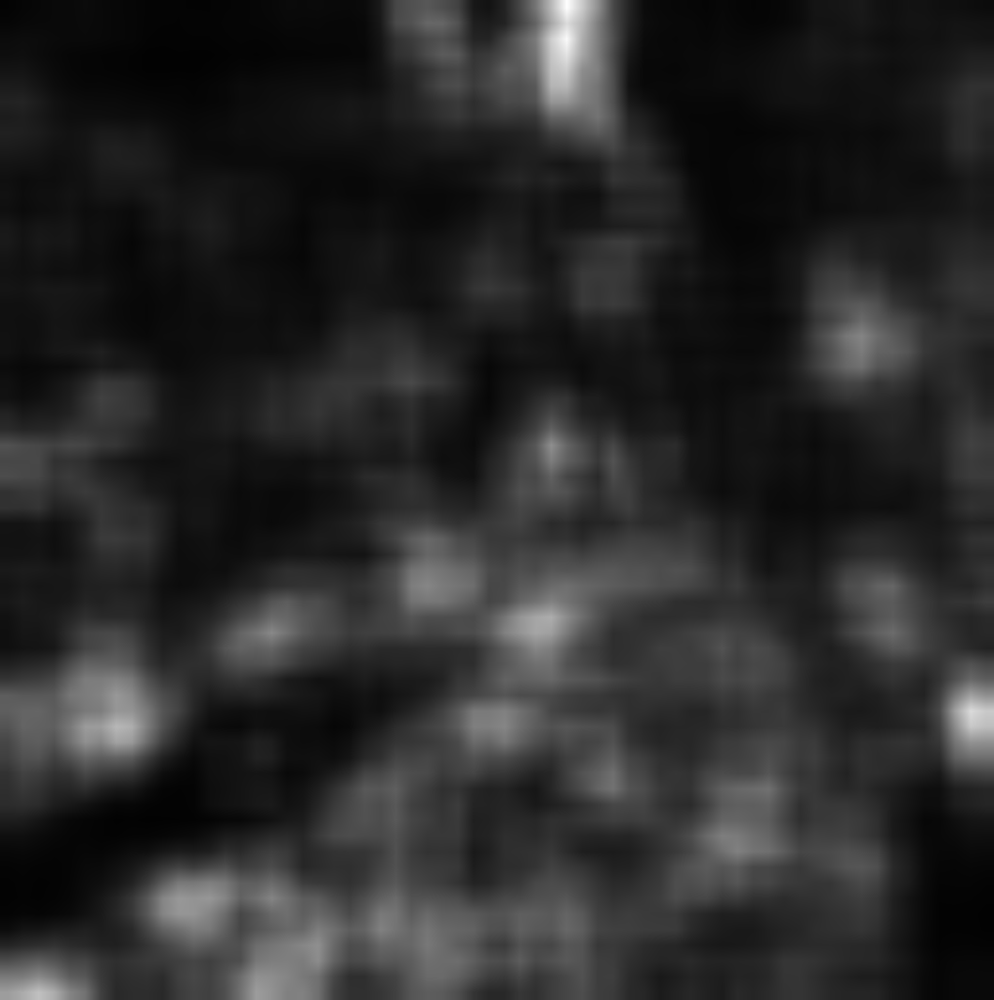

In [ ]:
saliency = cv2.saliency.StaticSaliencySpectralResidual_create()
(success, saliencyMap) = saliency.computeSaliency(image2)
saliencyMap = (saliencyMap * 255).astype("uint8")
cv2_imshow(saliencyMap)

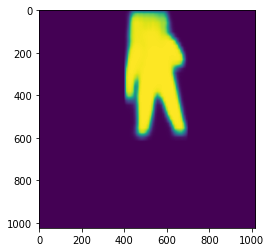

In [ ]:
model = torchvision.models.detection.maskrcnn_resnet50_fpn(pretrained=True)
model.eval()

image2_normalized = image2 / 255.
channels_first = np.moveaxis(image2_normalized, 2, 0)

channels_first = torch.from_numpy(channels_first).float()

prediction = model([channels_first])[0]
scores = prediction['scores'].detach().numpy()
masks = prediction['masks'].detach().numpy()
mask = masks[0][0]  
plt.imshow(masks[0][0])

<function matplotlib.pyplot.show>

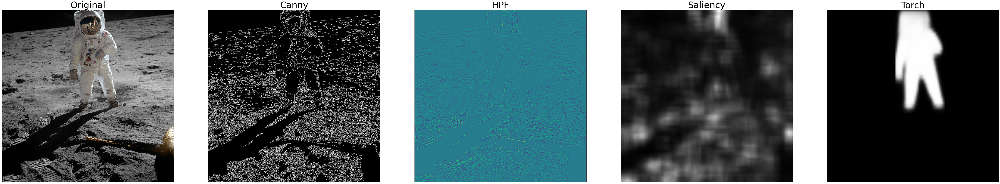

In [ ]:
plt.figure(figsize=(100,100))

plt.subplot(1,5,1),plt.imshow(cv2.cvtColor(image2, cv2.COLOR_RGB2BGR))
plt.title('Original', fontsize=50)
plt.xticks([]),plt.yticks([])

plt.subplot(1,5,2),plt.imshow(edges_canny)
plt.title('Canny', fontsize=50)
plt.xticks([]),plt.yticks([])

plt.subplot(1,5,3),plt.imshow(gauss_highpass)
plt.title('HPF', fontsize=50)
plt.xticks([]),plt.yticks([])

plt.subplot(1,5,4),plt.imshow(saliencyMap)
plt.title('Saliency', fontsize=50)
plt.xticks([]),plt.yticks([])

plt.subplot(1,5,5),plt.imshow(mask)
plt.title('Torch', fontsize=50)
plt.xticks([]),plt.yticks([])

plt.show

In [ ]:
image2_box_blurred = cv2.boxFilter(image2, -1, (20, 20))
image2_blurred = cv2.GaussianBlur(image2, (7, 7), 0)

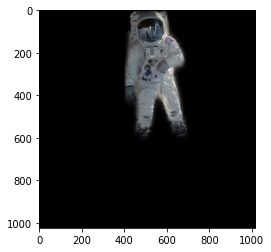

In [ ]:
r,g,b = cv2.split(image2_normalized)
mr = r * mask
mg = g * mask
mb = b * mask
subject = cv2.merge((mr, mg, mb))
subject = np.asarray(subject * 255.,dtype='uint8')
plt.imshow(subject)

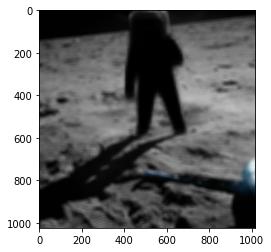

In [ ]:
inverted = np.abs(1. - mask)
image2_box_blurred_normalized = image2_box_blurred / 255
r,g,b = cv2.split(image2_box_blurred_normalized)
ir = r * inverted
ig = g * inverted
ib = b * inverted
background = cv2.merge((ir,ig,ib))
background = np.asarray(background * 255.,dtype='uint8')
plt.imshow(background)

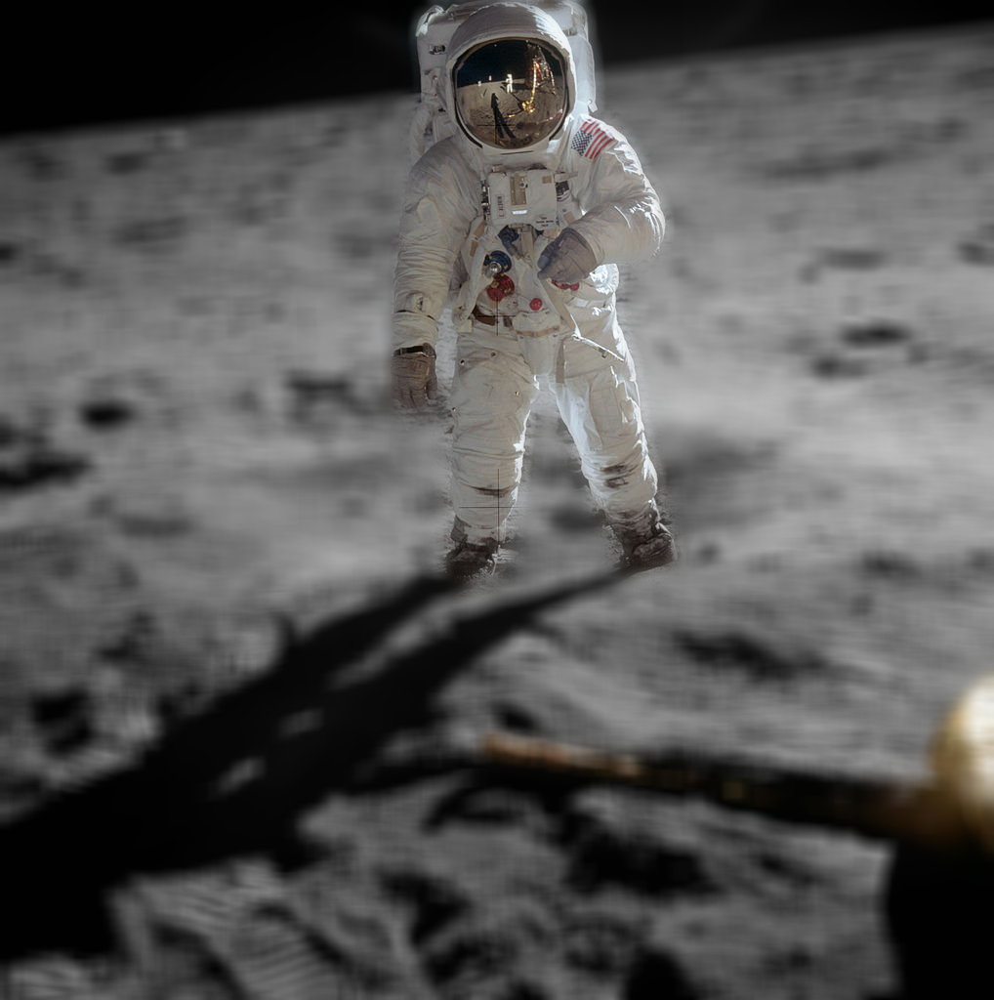

In [ ]:
final = subject + background
cv2_imshow(final)

###4.2 Graphical user interface

The graphical user interface (GUI) we created for our project was developed with the GUI Toolkit Tkinter.
Tkinter is a standard library of python and can be integrated without additional installations. We also use the Python image library (PIL), also known as Pillow, to integrate images in our project and being able to edit them.
The libraries are integrated into the project with the following commands.


In [ ]:
from tkinter import *
from tkinter import messagebox
from PIL import ImageTk, Image
from tkinter import filedialog

To use a graphical user interface in python we have to create a base window (root). This window will be then divided into two windows.

The main window (main_frame) is used to show the image which will be provided with the bokeh effect and is chosen by the user so that the editing on the image is viewable in realtime.

The tool window (tool_frame) is used to list all implemented effects a user can use to edit the chose image and create for example the bokeh effect with different fuzzy elements.

In [ ]:
root = Tk()
root.title("Bokeh Effekt")
root.config(background="#474747")

main_frame = Frame(root, width=500, height=500, background="#a5a5a5")
main_frame.pack(side=LEFT, padx=1, pady=1, fill=BOTH)

tool_frame = Frame(root)
tool_frame.pack(side=LEFT, padx=1, pady=1, fill=BOTH)

The different blur effects will all get their associated button. When a button is pressed the image at the main frame is directly edited and the chosen blur effect will be added.


In [ ]:
options_label = Label(tool_frame, text="Effekte")
options_label.pack(pady=10)

no_button = Button(tool_frame, text="Kein Effekt")
no_button.pack(padx=30, pady=30, fill=BOTH)

ring_button = Button(tool_frame, text="Ringe")
ring_button.pack(padx=30, pady=30, fill=BOTH)

star_button = Button(tool_frame, text="Sterne")
star_button.pack(padx=30, pady=30, fill=BOTH)

square_button = Button(tool_frame, text="Quadrate")
square_button.pack(padx=30, pady=30, fill=BOTH)

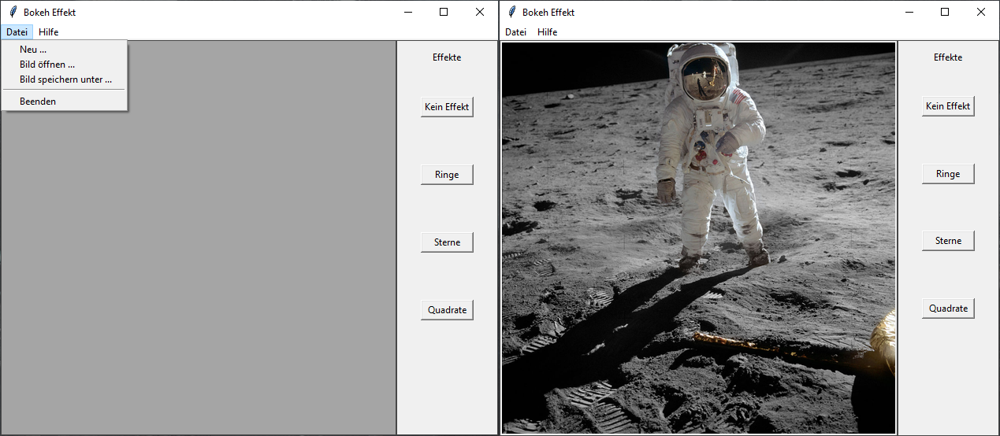

To make the navigation easier for the user and create a slick and pleasant look of the GUI we use menu bars where the user can find all the important and necessary options. For example the user can open a new image, the image can be saved or the program can be closed


In [ ]:
menu = Menu(root)

file_menu = Menu(menu, tearoff=0)
help_menu = Menu(menu, tearoff=0)

file_menu.add_command(label="Neu ...")
file_menu.add_command(label="Bild öffnen ...", command=open_image)
file_menu.add_command(label="Bild speichern unter ...", command=save_image)
file_menu.add_separator()
file_menu.add_command(label="Beenden", command=root.quit)
menu.add_cascade(label="Datei", menu=file_menu)

help_menu.add_command(label="Über das Projekt", command=help_about)
menu.add_cascade(label="Hilfe", menu=help_menu)

root.config(menu=menu)

When a user wants to open a new image the function 'open_image()' is used. The user now has to enter the file path to the picture which is going to be edited. Every usual image format is supported.

Saving of images is implemented by the function 'save_image()'. When a user wants to save an image the user will be asked where the image should be saved on the device. Furthermore a desired image format can be selected before the image is saved.

In [ ]:
def open_image():
    x = filedialog.askopenfilename(title='Bild öffnen')
    global img
    img = Image.open(x)
    img = img.resize((500, 500), Image.ANTIALIAS)
    img = ImageTk.PhotoImage(img)
    panel = Label(main_frame, image=img)
    panel.image = img
    panel.pack()


def save_image():
    y = filedialog.asksaveasfilename(title='Bild speichern unter', defaultextension='.png')
    # TBA

#5 Difficulties and restrictions

##5.1 Difficulties

While we were trying out different approaches how to implement and edit an image so that we have only have one object in focus while the rest is blurry we had some smaller problems. 
* train a machine learning algorithm (our case not that suited for the task)
* torch object from mask + background = black edges 
* while using torch edges of object were to far away so background was slightly visible 
* find a way to create the bokeh character




#References
###Bibliography
Dr. Schuhmacher (o.D.): Bokeh.
Access date (08.11.2020)

###List of figures
pexels.com 
> https://www.pexels.com/de-de/foto/beleuchtung-lichter-muster-verwischen-3557597/

wikimedia.org
>  https://upload.wikimedia.org/wikipedia/commons/8/8f/Bad_Bokeh_Background.jpg
https://upload.wikimedia.org/wikipedia/commons/thumb/3/36/Rubinar_500mm_5_6_V04.jpg/1024px-Rubinar_500mm_5_6_V04.jpg
https://upload.wikimedia.org/wikipedia/commons/thumb/f/f7/Scope_Aperture.jpg/1024px-Scope_Aperture.jpg

digital-photography-school.com
> https://i2.wp.com/digital-photography-school.com/wp-content/uploads/2014/08/Hacking_Photography_Helios_44-2_Lens-0451.jpg?w=600&ssl=1










